In [0]:
pip install networkx

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 21.2 MB/s eta 0:00:00
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


In [0]:
from pyspark.sql.functions import to_date

csv_file_path = "/Volumes/studentproject_01_exploration/studentproject_01_schema/files/Job History 1.csv"

# Set the legacy time parser policy
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

# Read the CSV file into a Spark DataFrame
df_spark = spark.read.option("header", "true").csv(csv_file_path)

# Convert "Reporting Date" to date type
df_spark = df_spark.withColumn("Reporting Date", to_date(df_spark["Reporting Date"], "dd-MMM-yy"))

# Filter the DataFrame to only include rows where the "Employee Status" is "Active" and "Reporting Date" is "2024-04-01"
filtered_df_spark = df_spark.filter(
    (df_spark["Employee Status"] == "Active") & 
    (df_spark["Reporting Date"] == "2024-04-01")
)

# # Display the Spark DataFrame
# display(filtered_df_spark)

In [0]:
row_count = filtered_df_spark.count()
row_count

5955

In [0]:
from pyspark.sql.functions import to_date

csv_file_path = "/Volumes/studentproject_01_exploration/studentproject_01_schema/files/Job History 1.csv"

# Set the legacy time parser policy
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

# Read the CSV file into a Spark DataFrame
df_spark = spark.read.option("header", "true").csv(csv_file_path)

# Convert "Reporting Date" to date type
df_spark = df_spark.withColumn("Reporting Date", to_date(df_spark["Reporting Date"], "dd-MMM-yy"))

# Select and display distinct "Reporting Date"
distinct_reporting_dates = df_spark.select("Reporting Date").distinct().orderBy("Reporting Date")

# Display the distinct Reporting Dates
distinct_reporting_dates.show(truncate=False)

# Print the total number of unique Reporting Dates
reporting_date_count = distinct_reporting_dates.count()
print(f"Total number of unique Reporting Dates: {reporting_date_count}")



+--------------+
|Reporting Date|
+--------------+
|2018-10-31    |
|2018-11-30    |
|2018-12-31    |
|2019-01-31    |
|2019-02-28    |
|2019-03-31    |
|2019-04-30    |
|2019-05-31    |
|2019-06-30    |
|2019-07-31    |
|2019-08-31    |
|2019-09-30    |
|2019-10-31    |
|2019-11-30    |
|2019-12-31    |
|2020-01-31    |
|2020-02-29    |
|2020-03-31    |
|2020-04-30    |
|2020-05-31    |
+--------------+
only showing top 20 rows

Total number of unique Reporting Dates: 67


In [0]:
# Filter the DataFrame for 'Person ID' = 63402 and display the details
person_details = filtered_df_spark.filter(filtered_df_spark['Person ID'] == 96618)
display(person_details)

Reporting Date,Person ID,Employee Status,Employee Class,Employment Type,Company (externalCode),Company (Label),Division (Code),Division,Subdivision (Code),Subdivision (Label),Department (Code),Department,JH Job Family (externalCode),JH Job Family,JH Position Title (externalCode),JH Position Title,External Title,Original Start Date,Hire Date,Last Day of Service,Sub Termination Reason (externalCode),Sub Termination Reason (Label),Location Group (Name),RCM City,RCM State (externalName),RCM Country (Picklist Label),Gender,Age (Group),Proj / OH,Placements,BU,Tenure (Group - Hire Date),Manager/No Manager,Critical / Core,Generation,Diversity Question,Job Level,Department (PM)
2024-04-01,96618,Active,Staff,Full-Time Employee,100,John Holland Group,MAP,Major Projects,MAPPRS,Major Projects,7113,Melbourne Metro Rail Project - Tunnels & Stations PPP,PEOP-HROP,People - HR Operations,PEO-HROP-PMGR,People Manager,People Manager,17/11/2008,17/11/2008,null,null,null,Victoria,Melbourne,Victoria,Australia,F,40-50 yrs,Project,null,Major Projects,15 yrs and more,Manager,Non critical,Millenial,6,5,No Move


In [0]:
csv_file_path = "/Volumes/studentproject_01_exploration/studentproject_01_schema/files/Job History Manager Change.csv"

# Read the CSV file into a Spark DataFrame
df_manager_spark = spark.read.option("header", "true").csv(csv_file_path)

# # Display the Spark DataFrame
# display(df_manager_spark)

In [0]:
df_manager_spark.dtypes

[('Event Date', 'string'),
 ('Event Month', 'string'),
 ('Person ID', 'string'),
 ('Gender', 'string'),
 ('Employee Status (Picklist Label)', 'string'),
 ('Employee Class (Picklist Label)', 'string'),
 ('Employment Type (Picklist Label)', 'string'),
 ('Division', 'string'),
 ('Subdivision (Label)', 'string'),
 ('Department Name', 'string'),
 ('JH Job Family (Label)', 'string'),
 ('JH Position Title (Label)', 'string'),
 ('External Title', 'string'),
 ('Supervisor ID', 'string'),
 ('Diversity Question', 'string')]

In [0]:
from pyspark.sql.functions import to_date, col
from pyspark.sql.types import IntegerType

# Convert "Event Date" and "Event Month" to date type
df_manager_spark = df_manager_spark.withColumn("Event Date", to_date(col("Event Date"), "dd/MM/yyyy"))
df_manager_spark = df_manager_spark.withColumn("Event Month", to_date(col("Event Month"), "MM/yyyy"))

# Convert 'Person ID' and 'Supervisor ID' to integer
#df_manager_spark = df_manager_spark.withColumn("Person ID", col("Person ID").cast(IntegerType()))
#df_manager_spark = df_manager_spark.withColumn("Supervisor ID", col("Supervisor ID").cast(IntegerType()))

display(df_manager_spark.dtypes)

_1,_2
Event Date,date
Event Month,date
Person ID,string
Gender,string
Employee Status (Picklist Label),string
Employee Class (Picklist Label),string
Employment Type (Picklist Label),string
Division,string
Subdivision (Label),string
Department Name,string


In [0]:
from pyspark.sql import Window
from pyspark.sql.functions import row_number, desc, col

# Convert "Event Date" to date type
df_manager_spark = df_manager_spark.withColumn("Event Date", to_date(df_manager_spark["Event Date"], "dd/MM/yyyy"))

# Check for missing or incorrect 'Event Date' values
filtered_df_manager_spark = df_manager_spark.filter(col("Event Date").isNotNull())

# Define a window partitioned by 'Person ID', ordered by 'Event Date' in descending order
window = Window.partitionBy('Person ID').orderBy(desc('Event Date'))

# Add a row number to each row in the window
filtered_df_manager_spark = filtered_df_manager_spark.withColumn('row_number', row_number().over(window))

# Keep only the first row (i.e., the most recent record) for each 'Person ID'
filtered_df_manager_spark = filtered_df_manager_spark.filter(filtered_df_manager_spark['row_number'] == 1)

# Drop the 'row_number' column
filtered_df_manager_spark = filtered_df_manager_spark.drop('row_number')

# Filter out rows where 'Supervisor ID' is 'NO_MANAGER'
filtered_df_manager_spark = filtered_df_manager_spark.filter(filtered_df_manager_spark['Supervisor ID'] != 'NO_MANAGER')

# # Display the Spark DataFrame
# display(filtered_df_manager_spark)

In [0]:
# Filter the DataFrame for 'Person ID' = 63402 and display the details
person_details = filtered_df_spark.filter(filtered_df_spark['Person ID'] == 63402)
display(person_details)

#### Make sure all Person IDs and Supervisor IDs exist

In [0]:
# Make sure all Person IDs and Supervisor IDs exist
from pyspark.sql.functions import col

all_person_ids = filtered_df_spark.select('Person ID').distinct().collect()

# Convert all_person_ids to a DataFrame
all_person_ids_df = spark.createDataFrame(all_person_ids)

# Rename the column to 'Person ID'
all_person_ids_df = all_person_ids_df.withColumnRenamed('_1', 'Person ID')

# Join filtered_df_manager_spark with all_person_ids_df on 'Person ID'
filtered_df_manager_spark = filtered_df_manager_spark.join(all_person_ids_df, on='Person ID', how='inner')

# Rename the column in all_person_ids_df to 'Supervisor ID'
all_person_ids_df = all_person_ids_df.withColumnRenamed('Person ID', 'Supervisor ID')

# Join filtered_df_manager_spark with all_person_ids_df on 'Supervisor ID'
filtered_df_manager_spark = filtered_df_manager_spark.join(all_person_ids_df, on='Supervisor ID', how='inner')

# display(filtered_df_manager_spark)

In [0]:
# Join filtered_df_spark with filtered_df_manager_spark on 'Person ID'
result_df = filtered_df_spark.join(filtered_df_manager_spark.select('Person ID', 'Supervisor ID'), on='Person ID', how='left')
display(result_df)
# result_df.count()

In [0]:
# 打印 result_df 的所有列名
print("Columns in result_df:", result_df.columns)


Columns in result_df: ['Person ID', 'Reporting Date', 'Employee Status', 'Employee Class', 'Employment Type', 'Company (externalCode)', 'Company (Label)', 'Division (Code)', 'Division', 'Subdivision (Code)', 'Subdivision (Label)', 'Department (Code)', 'Department', 'JH Job Family (externalCode)', 'JH Job Family', 'JH Position Title (externalCode)', 'JH Position Title', 'External Title', 'Original Start Date', 'Hire Date', 'Last Day of Service', 'Sub Termination Reason (externalCode)', 'Sub Termination Reason (Label)', 'Location Group (Name)', 'RCM City', 'RCM State (externalName)', 'RCM Country (Picklist Label)', 'Gender', 'Age (Group)', 'Proj / OH', 'Placements', 'BU', 'Tenure (Group - Hire Date)', 'Manager/No Manager', 'Critical / Core', 'Generation', 'Diversity Question', 'Job Level', 'Department (PM)', 'Supervisor ID']


In [0]:
from pyspark.sql.functions import col

# Filter out rows where 'Employee Class' is 'Workforce'
result_df = result_df.filter(col('Employee Class') != 'Workforce')

display(result_df)

In [0]:
# Display the number of rows in result_df
display(result_df.count())


4419

# Construct the Graph

In [0]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph
G = nx.Graph()

# Create an empty graph 
G.clear()

# Convert PySpark DataFrame to Pandas DataFrame
pd_result_df = result_df.toPandas()

# Define the values to be replaced
values_to_replace = ['Customer & Corp Affairs', 'Chief Operations Office', 'Commercial', 'Executive Management', 'Finance & Group Services', 'HSE', 'ICT', 'People', 'Strategy', 'WA Region']

# Replace the values in the 'BU' column of the copied DataFrame
pd_result_df['BU'] = pd_result_df['BU'].replace(values_to_replace, 'Corporate')

# Define a color map
COLOR_MAP = {
    'Major Projects': 'salmon',
    'Infrastructure': 'slateblue',
    'Rail': 'lightgreen',
    'Building': 'khaki',
    'Corporate': 'chocolate',
    'TEK': 'lightblue'
}

# # Get the count of each unique value in the 'BU' column of the copied DataFrame
# value_counts = pd_result_df['BU'].value_counts()

# # Print the count of each unique value
# print(value_counts)

# Iterate over the rows of the Pandas DataFrame
for index, row in pd_result_df.iterrows():
    # Add the row as a node to the graph
    G.add_node(index, attr_dict=row.to_dict())

# Print the number of nodes in the graph
print(f"Number of nodes: {G.number_of_nodes()}")

Number of nodes: 4419


In [0]:
# # Get the count of each unique value in the 'BU' column
value_counts = pd_result_df['BU'].value_counts()

# # Print the count of each unique value
print(value_counts)

Infrastructure    1321
Major Projects    1082
Rail               905
Building           592
Corporate          425
TEK                 94
Name: BU, dtype: int64


In [0]:
# # Define a color map
color_map = {
     'Major Projects': 'salmon',
     'Infrastructure': 'slateblue',
     'Rail': 'lightgreen',
     'Building': 'khaki',
     'Corporate': 'chocolate',
     'TEK': 'lightblue'
}

# # Get the colors of the nodes
node_colors = [color_map.get(G.nodes[node].get('attr_dict').get('BU', 'NULL'), 'lightpink') for node in G.nodes]

# # Get the labels of the nodes
node_labels = {node: G.nodes[node].get('attr_dict').get('Person ID', 'N/A') for node in G.nodes}

# # Get the spring layout positions
pos = nx.random_layout(G)

# # Draw the graph
nx.draw(G, pos, with_labels=True, node_color=node_colors, labels=node_labels, font_size=5, node_size=10)

# # Show the plot
plt.show()

In [0]:
# Get the colors of the nodes
color_map = COLOR_MAP
node_colors = [color_map.get(G.nodes[node].get('attr_dict').get('BU', 'NULL'), 'lightpink') for node in G.nodes]

# Get the spring layout positions
pos = nx.random_layout(G)

# Draw the graph
nx.draw(G, pos, with_labels=False, node_color=node_colors, node_size=5)

# Show the plot
plt.show()

### Undirected Graph

In [0]:
# Add edges from 'Person ID' to 'Supervisor ID' with 'is_manager' attribute
for node in G.nodes:
    supervisor_id = G.nodes[node].get('attr_dict').get('Supervisor ID')
    
    # Check if 'Supervisor ID' equals to another node's 'Person ID'
    for other_node in G.nodes:
        person_id = G.nodes[other_node].get('attr_dict').get('Person ID')
        
        if supervisor_id == person_id:
            G.add_edge(node, other_node, is_manager=True)

# Get the colors of the nodes
color_map = COLOR_MAP
node_colors = [color_map.get(G.nodes[node].get('attr_dict').get('BU', 'NULL'), 'lightpink') for node in G.nodes]

labels = {node: G.nodes[node].get('attr_dict').get('Person ID', 'N/A') for node in G.nodes}

# Draw the new graph with labels
nx.draw(G, pos, node_color=node_colors, with_labels=False, node_size=5)

In [0]:
# Find the node with 'Person ID' = 12355
node_12355 = None
for node in G.nodes:
    if G.nodes[node].get('attr_dict').get('Person ID') == '12355':
        node_12355 = node
        break

# If the node is found, get its edges
if node_12355 is not None:
    node_12355 = G.edges(node_12355, data=True)

    # Print the edges
    for edge in node_12355:
        print(edge)
else:
    print("Node with 'Person ID' = 12355 does not exist in the graph.")


(1796, 1303, {'is_manager': True})
(1796, 3011, {'is_manager': True})
(1796, 2056, {'is_manager': True})
(1796, 3464, {'is_manager': True})
(1796, 3940, {'is_manager': True})


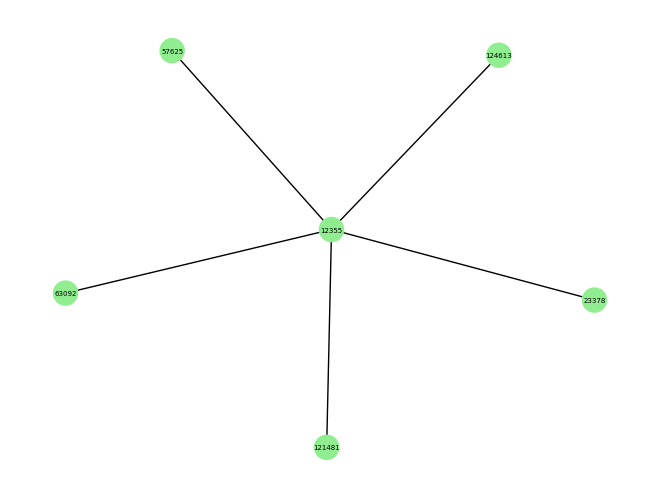

In [0]:
# Example (the node with 'Person ID' = 12355)
from collections import deque

# Create a new graph
G_1199 = nx.Graph()

# Use a queue to implement BFS
# Got 1199 from the previous cell
queue = deque([1796])

while queue:
    node = queue.popleft()
    G_1199.add_node(node)
    neighbors = list(G.neighbors(node))
    G_1199.add_nodes_from(neighbors)
    
    for neighbor in neighbors:
        if G.has_edge(node, neighbor):
            G_1199.add_edge(node, neighbor)
            
        if neighbor not in G_1199:
            queue.append(neighbor)

# Create a dictionary of labels
labels = {node: G.nodes[node].get('attr_dict').get('Person ID') for node in G_1199.nodes}

# Get the colors of the nodes
node_colors = [color_map.get(G.nodes[node].get('attr_dict').get('BU', 'NULL'), 'lightpink') for node in G_1199.nodes]

# Draw the new graph with labels
nx.draw(G_1199, labels=labels, node_color=node_colors, with_labels=True, font_size=5)
plt.show()

## Directed Graph

In [0]:
# Create an empty graph
Gr = nx.DiGraph()
Gr.clear()

# Iterate over the rows of the DataFrame
for index, row in pd_result_df.iterrows():
    # Add the row as a node to the graph
    Gr.add_node(index, attr_dict=row.to_dict())

# Print the number of nodes in the graph
print(f"Number of nodes: {Gr.number_of_nodes()}")

# Get the colors of the nodes
color_map = COLOR_MAP
node_colors = [color_map.get(Gr.nodes[node].get('attr_dict').get('BU', 'NULL'), 'pink') for node in Gr.nodes]

# Get the spring layout positions
pos = nx.random_layout(Gr)

# Draw the subgraph
nx.draw(Gr, pos, with_labels=False, node_color=node_colors, node_size=5)

# Show the plot
plt.show()

In [0]:
# Add edges from 'Person ID' to 'Supervisor ID' with 'manager' attribute
for node in Gr.nodes:
    supervisor_id = Gr.nodes[node].get('attr_dict').get('Supervisor ID')
    
    # Check if 'Supervisor ID' equals to another node's 'Person ID'
    for other_node in Gr.nodes:
        person_id = Gr.nodes[other_node].get('attr_dict').get('Person ID')
        
        if supervisor_id == person_id:
            Gr.add_edge(node, other_node, manager=True)

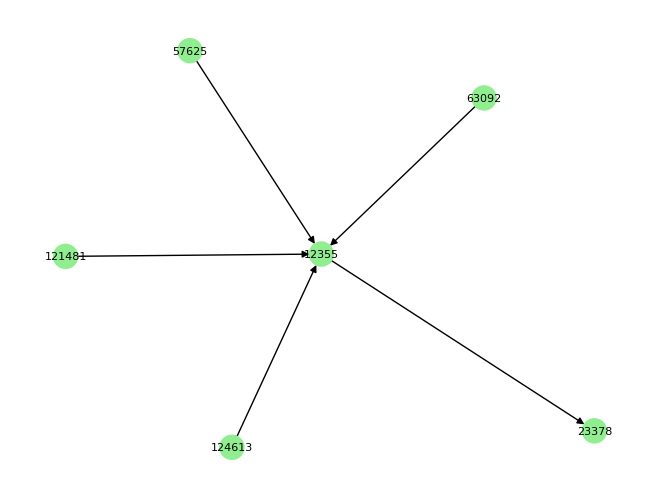

In [0]:
# Define the specific nodes
# Got these number from cell 17
specific_nodes = [1796, 1303, 3011, 2056, 3464, 3940]

# Create a subgraph containing only the specific nodes
subgraph = Gr.subgraph(specific_nodes).copy()

# Get the colors of the nodes in the subgraph
color_map = COLOR_MAP
node_colors = [color_map.get(subgraph.nodes[node].get('attr_dict').get('BU', 'NULL'), 'pink') for node in subgraph.nodes]

# Create a dictionary of labels for the subgraph
labels = {node: subgraph.nodes[node].get('attr_dict').get('Person ID') for node in subgraph.nodes}

# Draw the subgraph with labels and edges
pos = nx.spring_layout(subgraph)  # You can choose different layouts like spring_layout or shell_layout
nx.draw(subgraph, pos, labels=labels, node_color=node_colors, with_labels=True, font_size=8, edge_color='black')
plt.show()

In [0]:
import networkx as nx

# Calculate degree centrality for the nodes in the subgraph
degree_centrality = nx.degree_centrality(subgraph)

# Display the degree centrality
display(degree_centrality)

{3011: 0.2, 1796: 1.0, 3940: 0.2, 2056: 0.2, 3464: 0.2, 1303: 0.2}

In [0]:
# Access Person ID for each node in the graph Gr
person_ids = {node: Gr.nodes[node].get('attr_dict', {}).get('Person ID', 'N/A') for node in Gr.nodes}

# Convert the dictionary to a Spark DataFrame
person_ids_df = spark.createDataFrame([(node, person_id) for node, person_id in person_ids.items()], ['node', 'Person ID'])

# Display the DataFrame
display(person_ids_df)

node,Person ID
0,10066
1,10074
2,10076
3,10079
4,10087
5,10284
6,10289
7,10357
8,10390
9,10411


###  Degree of Centrality

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.window import Window
# Calculate degree centrality for all nodes in the graph Gr without the 'normalized' argument
all_degree_centrality = nx.degree_centrality(Gr)

# Create a List of Tuples including 'node', 'Person ID', 'Business Unit', and 'degree centrality'
data = [
    (
        int(node), 
        Gr.nodes[node].get('attr_dict').get('Person ID'), 
        Gr.nodes[node].get('attr_dict').get('BU'), 
        Gr.nodes[node].get('attr_dict').get('Gender'),
        Gr.nodes[node].get('attr_dict').get('JH Position Title (externalCode)'),
        Gr.nodes[node].get('attr_dict').get('External Title'),
        Gr.nodes[node].get('attr_dict').get('Department'),
        centrality
    )
    for node, centrality in all_degree_centrality.items()
]

# Initialize SparkSession if not already done
spark = SparkSession.builder.appName("DegreeCentrality").getOrCreate()

# Create a Spark DataFrame from the list of tuples
degree_centrality_df = spark.createDataFrame(data, ['node', 'Person ID', 'BU', 'Gender', 'JH Position Title (externalCode)', 'External Title','Department', 'degree_centrality'])

# Display the DataFrame
display(degree_centrality_df)

node,Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,degree_centrality
0,10066,Corporate,M,IT-PROJ-ITPM,Project IT Systems Manager,Applications & Emerging Technology,6.79040289723857E-4
1,10074,Rail,M,TAL-CONSTR-GSUP,Superintendent,Sunshine Systems Alliance,2.2634676324128565E-4
2,10076,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Melbourne Water Capital Delivery Program,2.2634676324128565E-4
3,10079,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,Rozelle Interchange (Westconnex 3B),0.002037120869171571
4,10087,Rail,M,PDEL-RAIL-SEPM,Senior Project Manager,Metro Tunnel Rail Network Alliance,2.2634676324128565E-4
5,10284,Rail,M,PDEL-RAIL-RSUPOHW,Superintendent - OHW,More Trains More Services (MTMS),2.2634676324128565E-4
6,10289,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,West Gate Tunnel Project,0.002489814395654142
7,10357,Rail,M,TAL-TRACK-TRACKSUP,Supervisor,RIS NSW - Track & Civil,2.2634676324128565E-4
8,10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,2.2634676324128565E-4
9,10411,Corporate,F,LEGL-LEGC-SELC,Senior Legal Counsel,Group Legal,2.2634676324128565E-4


In [0]:
import networkx as nx
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# Define a window specification
# This partitions the data by 'Business Unit' and orders by 'degree centrality' in descending order
window_spec = Window.partitionBy('BU').orderBy(F.desc('degree_centrality'))

#  Add a rank column to assign ranks bas
ranked_df = degree_centrality_df.withColumn('rank', F.rank().over(window_spec))

#  Filter to get only the top 5 for each Business Unit
top_5_df = ranked_df.filter(ranked_df.rank <= 5)

#  Drop the rank column if it's no longer needed
top_5_df = top_5_df.drop('rank')

#  Display the final DataFrame containing the top 5 highest degree centrality for each Business Unit
display(top_5_df)

node,Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,degree_centrality
1741,123337,Building,M,PDEL-BUILD-PRDB,Project Director,CEP Office,0.005432322317790856
4110,85305,Building,M,PDEL-BUILD-PRMB,Project Manager,Waterloo Integrated Station Development - Southern Precinct,0.004979628791308284
1197,120484,Building,M,PDEL-BUILD-OPMB,Operations Manager,Building NSW/ACT Operations,0.0036215482118605704
4400,98878,Building,M,PDEL-BUILD-PRDB,Project Director,Queensland Train Manufacturing Program,0.0036215482118605704
3136,33279,Building,M,PDEL-BUILD-PRMB,Project Manager,Macquarie Square Sitewide Works,0.003168854685377999
3746,60600,Corporate,M,IT-ITM-CIO,Chief Digital and Information Officer,IT Management,0.004979628791308284
1219,120604,Corporate,M,IT-ITM-GMIT,General Manager Applications and Emerging Technology,Applications & Emerging Technology,0.003168854685377999
4266,92606,Corporate,M,IT-SERMAN-SOM,IT Service Operations Manager,IT Technology Operations,0.002716161158895428
172,111902,Corporate,M,IT-ITM-GMIT,General Manager - IT Technology Operations,IT Technology Operations,0.002489814395654142
3753,60687,Corporate,M,HSC-SAFE-GMS,Group General Manager HSC,"Health, Sustainability, Climate",0.002489814395654142


In [0]:
# Convert node 2668 attributes to a Spark DataFrame with columns for each attribute
node_2668_attributes = [(key, value) for key, value in Gr.nodes[396].items()]
node_2668_df = spark.createDataFrame(node_2668_attributes, ['Attribute', 'Value'])

# Display the attributes of node 2668
display(node_2668_df)

Attribute,Value
attr_dict,"Map(JH Job Family -> Project Delivery - Rail, BU -> Rail, Generation -> Millenial, Department -> Rail New Zealand, Placements -> null, Subdivision (Label) -> Rail Projects, Department (Code) -> RNZ, Last Day of Service -> null, Company (externalCode) -> 560, JH Position Title -> Operations Manager - Large BUs, Sub Termination Reason (externalCode) -> null, Hire Date -> 1/03/2023, Original Start Date -> 15/03/2019, Location Group (Name) -> New Zealand, Division -> Rail & Transport, JH Job Family (externalCode) -> PDEL-RAIL, Reporting Date -> 2024-04-01, Division (Code) -> RAL, Employee Status -> Active, Person ID -> 114332, Employment Type -> Full-Time Employee, External Title -> Operations Manager NSW, QLD & New Zealand, Proj / OH -> Project, Tenure (Group - Hire Date) -> 1-2 yrs, Age (Group) -> 40-50 yrs, Department (PM) -> No Move, Supervisor ID -> null, Diversity Question -> 6, JH Position Title (externalCode) -> PDEL-RAIL-OPML, Manager/No Manager -> Manager, RCM State (externalName) -> Auckland, RCM Country (Picklist Label) -> New Zealand, Job Level -> 8, Critical / Core -> Critical, Employee Class -> Staff, Subdivision (Code) -> RALPR, Company (Label) -> John Holland (NZ) Locals, Gender -> M, Sub Termination Reason (Label) -> null, RCM City -> Parnell)"


In [0]:
# Find all nodes pointing to node 2668 in graph Gr and their Person IDs
pointing_nodes_2668_with_ids = [(node, Gr.nodes[node].get('attr_dict').get('Person ID')) for node in Gr.nodes() if 3890 in Gr.neighbors(node)]

# Convert the list of nodes and Person IDs to a Spark DataFrame
pointing_nodes_2668_with_ids_df = spark.createDataFrame(pointing_nodes_2668_with_ids, ['Node', 'Person ID'])

# Display the DataFrame
display(pointing_nodes_2668_with_ids_df)

Node,Person ID
6,10289
60,110824
61,110829
81,111150
123,111430
156,111640
185,112068
301,113360
343,113777
350,113835


'/tmp/subgraph_pointing_and_neighbors_2668.png'

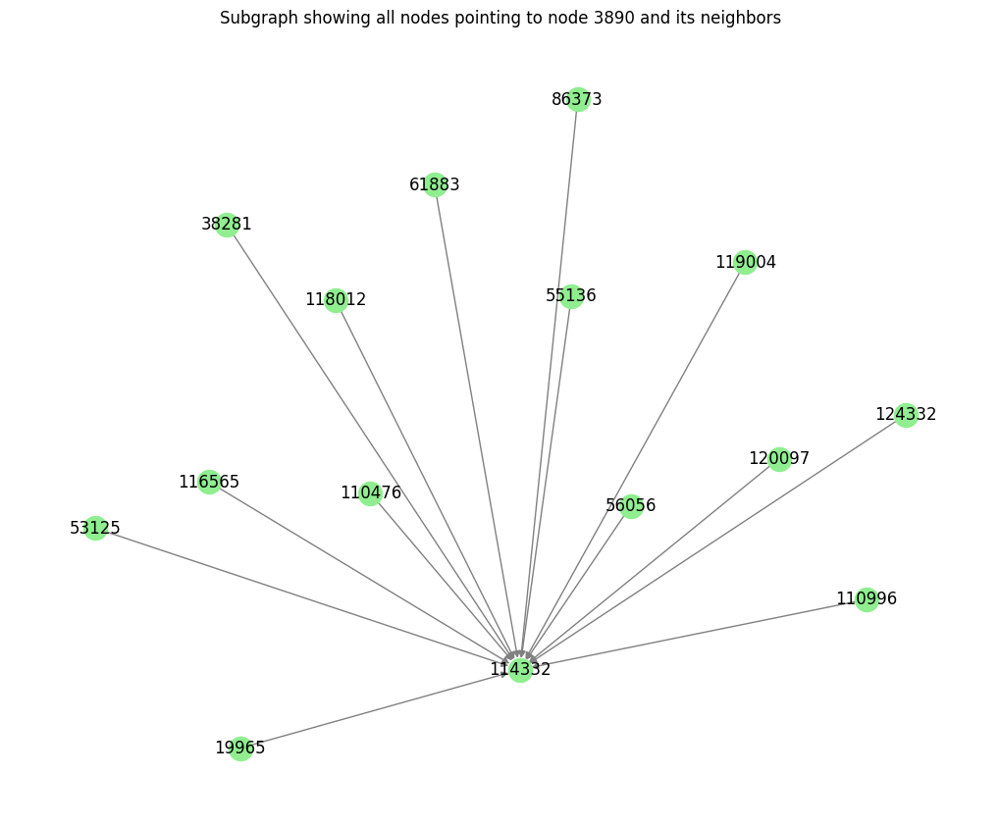

In [0]:
# Create a subgraph for all nodes pointing to node 2668 and its neighbors
pointing_nodes_3890 = list(Gr.predecessors(396))
pointing_and_neighbors_nodes = pointing_nodes_3890 + list(Gr.neighbors(396)) + [396]
subgraph_pointing_and_neighbors = Gr.subgraph(pointing_and_neighbors_nodes)

# Generate positions for each node using NetworkX's layout algorithm
pos = nx.spring_layout(subgraph_pointing_and_neighbors)

# Prepare labels with 'Person ID' instead of node number
labels = {node: Gr.nodes[node].get('attr_dict').get('Person ID', node) for node in subgraph_pointing_and_neighbors.nodes()}

# Draw the subgraph with 'Person ID' as labels
plt.figure(figsize=(10, 8))
nx.draw(subgraph_pointing_and_neighbors, pos, labels=labels, with_labels=True, node_color='lightgreen', edge_color='gray')
plt.title('Subgraph showing all nodes pointing to node 3890 and its neighbors')

# Save the plot as an image and display it in Databricks
plt.savefig("/tmp/subgraph_pointing_and_neighbors_2668.png")
display("/tmp/subgraph_pointing_and_neighbors_2668.png")

In [0]:
# Filter the DataFrame where 'Supervisor ID' is 88947 and select 'Person ID'
person_ids_df = result_df.filter(result_df['Supervisor ID'] == 88947).select('Person ID')

# Display the filtered DataFrame
display(person_ids_df)

Person ID
10756
11032
117922
124150
124211
54314
57002
93386


In [0]:
from pyspark.sql.functions import col, lit

# Assuming person_ids_df has a column named 'Person ID'
# Add a new column 'Supervisor Node' with a default value
person_ids_with_supervisor = person_ids_df.withColumn('Supervisor Node', lit('default_value'))

# Convert the DataFrame to a list of tuples directly without converting to RDD
edges = [
    (row['Supervisor Node'], row['Person ID']) 
    for row in person_ids_with_supervisor.collect()
]

# Create edges in the graph Gr for each person ID with their supervisor node 2668
for edge in edges:
    Gr.add_edge(*edge)

# Display the updated graph
display(Gr)

In [0]:
# # Get the colors of the nodes in the Gr graph
# color_map = COLOR_MAP
# node_colors = [color_map.get(Gr.nodes[node].get('attr_dict').get('BU', 'NULL'), 'pink') for node in Gr.nodes]

# # Create a dictionary of labels for the subgraph
# labels = {node: Gr.nodes[node].get('attr_dict').get('Person ID') for node in Gr.nodes}

# # Draw the subgraph with labels
# nx.draw(Gr, labels=labels, node_color=node_colors, with_labels=True, font_size=5)
# plt.show()

In [0]:
print(Gr.nodes[1199].get('attr_dict').get('Department'))

Melbourne Metro Rail Project - Tunnels & Stations PPP


There are 116 nodes in the 'Metro Tunnel Rail Network Alliance' department.


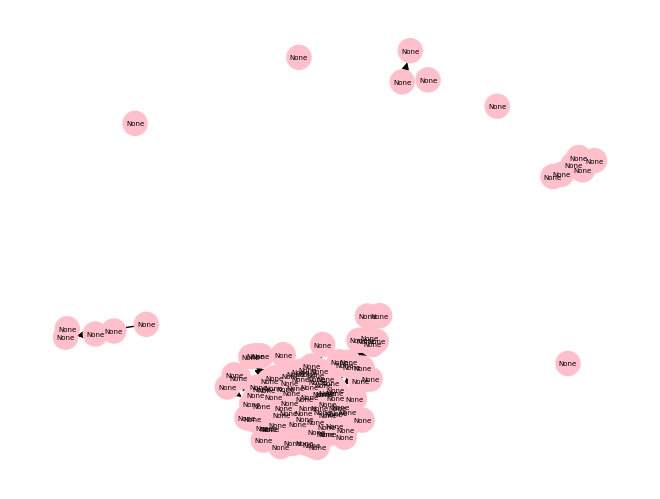

In [0]:
# Find nodes in the specific department
nodes_in_department = [
    node for node, attr in Gr.nodes(data=True) 
    if attr.get('attr_dict') and attr.get('attr_dict').get('Department') == 'Metro Tunnel Rail Network Alliance'
]

print(f"There are {len(nodes_in_department)} nodes in the 'Metro Tunnel Rail Network Alliance' department.")

# Create a subgraph of G that contains only the nodes in the specific department
subgraph_1 = Gr.subgraph(nodes_in_department)

# Get the colors of the nodes in the subgraph
color_map = COLOR_MAP
node_colors = [
    color_map.get(Gr.nodes[node].get('BU', 'NULL'), 'pink') 
    for node in subgraph_1.nodes
]

# Create a dictionary of labels for the subgraph
labels = {
    node: Gr.nodes[node].get('Person ID') 
    for node in subgraph_1.nodes
}

# Display the subgraph
nx.draw(subgraph_1, labels=labels, node_color=node_colors, with_labels=True, font_size=5)

##  Degree of Centrality

In [0]:
# Calculate degree centrality for the entire graph
degree_centrality = nx.degree_centrality(Gr)

# Extract degree centrality for person ID 1199
person_id_1199_centrality = degree_centrality.get(12355)

# Display the degree centrality for person ID 1199
display({"text/plain": f"Degree Centrality for Person ID 1199: {person_id_1199_centrality}"})

{'text/plain': 'Degree Centrality for Person ID 1199: None'}

## Betweenness Centrality

In [0]:
# Calculate betweenness centrality
betweenness_centrality = nx.betweenness_centrality(Gr, normalized=True, endpoints=False)

# Convert the centrality data into a Spark DataFrame
data_bc = [
    (
        Gr.nodes[node].get('attr_dict', {}).get('Person ID'),
        Gr.nodes[node].get('attr_dict', {}).get('BU'),
        Gr.nodes[node].get('attr_dict', {}).get('Gender'),
        Gr.nodes[node].get('attr_dict', {}).get('JH Position Title (externalCode)'),
        Gr.nodes[node].get('attr_dict', {}).get('External Title'),
        Gr.nodes[node].get('attr_dict', {}).get('Department'),
        centrality
    )
    for node, centrality in betweenness_centrality.items()
]

centrality_df = spark.createDataFrame(data_bc, ["Person ID", "BU", "Gender", 'JH Position Title (externalCode)', 'External Title', 'Department',"Betweenness Centrality"])

# Display the results in a table
display(centrality_df)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality
10066,Corporate,M,IT-PROJ-ITPM,Project IT Systems Manager,Applications & Emerging Technology,2.0414514679107817E-7
10074,Rail,M,TAL-CONSTR-GSUP,Superintendent,Sunshine Systems Alliance,0.0
10076,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Melbourne Water Capital Delivery Program,0.0
10079,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,Rozelle Interchange (Westconnex 3B),4.0829029358215634E-7
10087,Rail,M,PDEL-RAIL-SEPM,Senior Project Manager,Metro Tunnel Rail Network Alliance,0.0
10284,Rail,M,PDEL-RAIL-RSUPOHW,Superintendent - OHW,More Trains More Services (MTMS),0.0
10289,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,West Gate Tunnel Project,2.24559661470186E-6
10357,Rail,M,TAL-TRACK-TRACKSUP,Supervisor,RIS NSW - Track & Civil,0.0
10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0
10411,Corporate,F,LEGL-LEGC-SELC,Senior Legal Counsel,Group Legal,0.0


In [0]:
#  Define a window specification
# Partition by 'Business Unit' and order by 'Betweenness Centrality' in descending order
window_spec = Window.partitionBy('BU').orderBy(F.desc('Betweenness Centrality'))

# Add a rank column to rank nodes by betweenness centrality within each BU
ranked_df = centrality_df.withColumn('rank', F.rank().over(window_spec))

# Filter to get only the top 5 for each Business Unit
top_5_df = ranked_df.filter(ranked_df.rank <= 5)

# Optionally: Drop the rank column if it's no longer needed
top_5_df = top_5_df.drop('rank')
top_5_df = top_5_df.dropna()
#  Display the final DataFrame containing the top 5 highest betweenness centrality for each Business Unit
display(top_5_df)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality
120484,Building,M,PDEL-BUILD-OPMB,Operations Manager,Building NSW/ACT Operations,8.012697011549818E-6
123337,Building,M,PDEL-BUILD-PRDB,Project Director,CEP Office,7.85958815145651E-6
126504,Building,M,PDEL-INFR-OMLBU,Operations Manager,Building QLD/NT Operations,7.349225284478814E-6
117515,Building,F,PDEL-BUILD-PRDB,Project Director,Sydney Children's Hospital,6.8388624175011185E-6
80991,Building,M,PDEL-BUILD-SPMB,Senior Project Manager,Sydney Children's Hospital,4.4401569427059504E-6
111902,Corporate,M,IT-ITM-GMIT,General Manager - IT Technology Operations,IT Technology Operations,3.011140915168403E-6
92606,Corporate,M,IT-SERMAN-SOM,IT Service Operations Manager,IT Technology Operations,2.7559594816795553E-6
120604,Corporate,M,IT-ITM-GMIT,General Manager Applications and Emerging Technology,Applications & Emerging Technology,2.5007780481907076E-6
124722,Corporate,M,IT-ITM-SITM,"Head of IT Productivity, Integration & Development",Applications & Emerging Technology,1.12279830735093E-6
112243,Corporate,M,IT-SERMAN-SMTL,VIC/ SA/ TAS Team Lead,IT Technology Operations,9.186531605598517E-7


### Closeness Centrality

In [0]:
# Calculate closeness centrality for all nodes in the graph Gr
closeness_centrality = nx.closeness_centrality(Gr)

# Create a list of tuples of (node, Person ID, closeness centrality)
data = [
    (
        node,
        Gr.nodes[node].get('attr_dict', {}).get('Person ID'),
        Gr.nodes[node].get('attr_dict', {}).get('BU'),
        Gr.nodes[node].get('attr_dict', {}).get('Gender'),
        Gr.nodes[node].get('attr_dict', {}).get('JH Position Title (externalCode)'),
        Gr.nodes[node].get('attr_dict', {}).get('External Title'),
        Gr.nodes[node].get('attr_dict', {}).get('Department'),
        centrality
    )
    for node, centrality in closeness_centrality.items()
]

# Initialize SparkSession if not already done
spark = SparkSession.builder.appName("ClosenessCentrality").getOrCreate()

# Create a Spark DataFrame from the list of tuples
closeness_centrality_df = spark.createDataFrame(data, ['Node', 'Person ID', 'BU', 'Gender', 'JH Position Title (externalCode)', 'External Title','Department', 'Closeness Centrality'])

# Display the DataFrame
display(closeness_centrality_df)

Node,Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Closeness Centrality
0,10066,Corporate,M,IT-PROJ-ITPM,Project IT Systems Manager,Applications & Emerging Technology,4.5177320984865596E-4
1,10074,Rail,M,TAL-CONSTR-GSUP,Superintendent,Sunshine Systems Alliance,0.0
2,10076,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Melbourne Water Capital Delivery Program,0.0
3,10079,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,Rozelle Interchange (Westconnex 3B),0.0018070928393946238
4,10087,Rail,M,PDEL-RAIL-SEPM,Senior Project Manager,Metro Tunnel Rail Network Alliance,0.0
5,10284,Rail,M,PDEL-RAIL-RSUPOHW,Superintendent - OHW,More Trains More Services (MTMS),0.0
6,10289,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,West Gate Tunnel Project,0.0032155622583345516
7,10357,Rail,M,TAL-TRACK-TRACKSUP,Supervisor,RIS NSW - Track & Civil,0.0
8,10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0
9,10411,Corporate,F,LEGL-LEGC-SELC,Senior Legal Counsel,Group Legal,0.0


In [0]:
#  Define a window specification
# Partition by 'Business Unit' and order by 'Closeness Centrality' in descending order
window_spec = Window.partitionBy('BU').orderBy(F.desc('Closeness Centrality'))

# Add a rank column to rank nodes by closeness centrality within each BU
ranked_df = closeness_centrality_df.withColumn('rank', F.rank().over(window_spec))

# Filter to get only the top 5 for each Business Unit
top_5_df = ranked_df.filter(ranked_df.rank <= 5)

# Optionally: Drop the rank column if it's no longer needed
top_5_df = top_5_df.drop('rank').dropna()


display(top_5_df)

Node,Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Closeness Centrality
1197,120484,Building,M,PDEL-BUILD-OPMB,Operations Manager,Building NSW/ACT Operations,0.012712052339679819
4222,90346,Building,M,PDEL-BUILD-GEMB,General Manager Building QLD/NT,Building QLD/NT Operations,0.011838416248170355
2613,126504,Building,M,PDEL-INFR-OMLBU,Operations Manager,Building QLD/NT Operations,0.01112585425109469
3860,62061,Building,M,PDEL-BUILD-GEMB,General Manager Building NSW/ACT,Building NSW/ACT Operations,0.01004205971247062
1741,123337,Building,M,PDEL-BUILD-PRDB,Project Director,CEP Office,0.008370510503727129
3746,60600,Corporate,M,IT-ITM-CIO,Chief Digital and Information Officer,IT Management,0.011933631958266385
172,111902,Corporate,M,IT-ITM-GMIT,General Manager - IT Technology Operations,IT Technology Operations,0.006290490173932686
1219,120604,Corporate,M,IT-ITM-GMIT,General Manager Applications and Emerging Technology,Applications & Emerging Technology,0.00564951810857616
4266,92606,Corporate,M,IT-SERMAN-SOM,IT Service Operations Manager,IT Technology Operations,0.003829565929996165
164,111779,Corporate,M,PRCON-PCM-GGMPE,Group General Manager Pre-Contracts & Estimating,Commercial Management,0.0035419019652134635


### Eigen Vector Centrality

In [0]:
# Calculate eigenvector centrality for all nodes in the graph Gr with increased max_iter
eigenvector_centrality = nx.eigenvector_centrality(Gr, max_iter=300)

# Convert the centrality data into a list of tuples
# Include 'Person ID', 'Business Unit', and 'Eigenvector Centrality'
data = [
    (
        Gr.nodes[node].get('attr_dict', {}).get('Person ID'),
        Gr.nodes[node].get('attr_dict', {}).get('BU'),
        Gr.nodes[node].get('attr_dict', {}).get('Gender'),
        Gr.nodes[node].get('attr_dict', {}).get('JH Position Title (externalCode)'),
        Gr.nodes[node].get('attr_dict', {}).get('External Title'),
        Gr.nodes[node].get('attr_dict', {}).get('Department'),
        centrality
    )
    for node, centrality in eigenvector_centrality.items()
]

# Initialize SparkSession if not already done
spark = SparkSession.builder.appName("EigenvectorCentrality").getOrCreate()

# Create a Spark DataFrame from the list of tuples
eigenvector_centrality_df = spark.createDataFrame(data, ["Person ID", "BU", 'Gender', 'JH Position Title (externalCode)', 'External Title', 'Department',"Eigenvector Centrality"])

# Display the results in a table
display(eigenvector_centrality_df)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Eigenvector Centrality
10066,Corporate,M,IT-PROJ-ITPM,Project IT Systems Manager,Applications & Emerging Technology,5.949661367066313E-10
10074,Rail,M,TAL-CONSTR-GSUP,Superintendent,Sunshine Systems Alliance,2.2971665509908546E-12
10076,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Melbourne Water Capital Delivery Program,2.2971665509908546E-12
10079,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,Rozelle Interchange (Westconnex 3B),2.37297304717354E-9
10087,Rail,M,PDEL-RAIL-SEPM,Senior Project Manager,Metro Tunnel Rail Network Alliance,2.2971665509908546E-12
10284,Rail,M,PDEL-RAIL-RSUPOHW,Superintendent - OHW,More Trains More Services (MTMS),2.2971665509908546E-12
10289,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,West Gate Tunnel Project,2.3055052655709538E-7
10357,Rail,M,TAL-TRACK-TRACKSUP,Supervisor,RIS NSW - Track & Civil,2.2971665509908546E-12
10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,2.2971665509908546E-12
10411,Corporate,F,LEGL-LEGC-SELC,Senior Legal Counsel,Group Legal,2.2971665509908546E-12


In [0]:
# Define a window specification
# Partition by 'Business Unit' and order by 'Eigenvector Centrality' in descending order
window_spec = Window.partitionBy('BU').orderBy(F.desc('Eigenvector Centrality'))

# Add a rank column to rank nodes by eigenvector centrality within each BU
ranked_df = eigenvector_centrality_df.withColumn('rank', F.rank().over(window_spec))

# Filter to get only the top 5 for each Business Unit
top_5_df = ranked_df.filter(ranked_df.rank <= 5)

# Optionally: Drop the rank column if it's no longer needed
top_5_df = top_5_df.drop('rank').dropna()

# Display the final DataFrame containing the top 5 highest eigenvector centrality for each Business Unit
display(top_5_df)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Eigenvector Centrality
62061,Building,M,PDEL-BUILD-GEMB,General Manager Building NSW/ACT,Building NSW/ACT Operations,0.0776221090810132
90346,Building,M,PDEL-BUILD-GEMB,General Manager Building QLD/NT,Building QLD/NT Operations,0.0670372393242477
120484,Building,M,PDEL-BUILD-OPMB,Operations Manager,Building NSW/ACT Operations,0.003531951166708205
126504,Building,M,PDEL-INFR-OMLBU,Operations Manager,Building QLD/NT Operations,0.0029990941514643522
123724,Building,M,PDEL-BUILD-CMBLD,Construction Manager,Building VIC/SA/TAS/NZ Operations,5.981169831828009E-4
60600,Corporate,M,IT-ITM-CIO,Chief Digital and Information Officer,IT Management,7.545262755333423E-4
111902,Corporate,M,IT-ITM-GMIT,General Manager - IT Technology Operations,IT Technology Operations,1.4258629937494338E-5
120604,Corporate,M,IT-ITM-GMIT,General Manager Applications and Emerging Technology,Applications & Emerging Technology,9.309547702209671E-6
60639,Corporate,M,PCON-PCON-GMPC,General Manager Project Controls,Commercial Management,2.6009300726945753E-6
36738,Corporate,M,FIN-ACCT-GFIN,General Manager Group Finance,Financial Control,9.937106037941746E-7


### Combined Centralities

In [0]:
combined_centrality_df = centrality_df.join(
    closeness_centrality_df, 
    (centrality_df["Person ID"] == closeness_centrality_df["Person ID"]) & 
    (centrality_df["BU"] == closeness_centrality_df["BU"]) &
    (centrality_df["Gender"] == closeness_centrality_df["Gender"]) &
    (centrality_df["JH Position Title (externalCode)"] == closeness_centrality_df["JH Position Title (externalCode)"]) &
    (centrality_df["External Title"] == closeness_centrality_df["External Title"]) &
    (centrality_df["Department"] == closeness_centrality_df["Department"]),
    "inner"
).select(
    centrality_df["Person ID"], 
    centrality_df["BU"],
    centrality_df["Gender"],
    centrality_df["JH Position Title (externalCode)"],
    centrality_df["External Title"],
    centrality_df["Department"],
    "Betweenness Centrality", 
    "Closeness Centrality"
)

# Display the combined centrality DataFrame with 'BU'
display(combined_centrality_df)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality
10066,Corporate,M,IT-PROJ-ITPM,Project IT Systems Manager,Applications & Emerging Technology,2.0414514679107817E-7,4.5177320984865596E-4
10074,Rail,M,TAL-CONSTR-GSUP,Superintendent,Sunshine Systems Alliance,0.0,0.0
10076,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Melbourne Water Capital Delivery Program,0.0,0.0
10079,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,Rozelle Interchange (Westconnex 3B),4.0829029358215634E-7,0.0018070928393946238
10087,Rail,M,PDEL-RAIL-SEPM,Senior Project Manager,Metro Tunnel Rail Network Alliance,0.0,0.0
10284,Rail,M,PDEL-RAIL-RSUPOHW,Superintendent - OHW,More Trains More Services (MTMS),0.0,0.0
10289,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,West Gate Tunnel Project,2.24559661470186E-6,0.0032155622583345516
10357,Rail,M,TAL-TRACK-TRACKSUP,Supervisor,RIS NSW - Track & Civil,0.0,0.0
10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0,0.0
10411,Corporate,F,LEGL-LEGC-SELC,Senior Legal Counsel,Group Legal,0.0,0.0


In [0]:
final_combined_centrality_df = combined_centrality_df.join(
    eigenvector_centrality_df, 
    on=[
        (combined_centrality_df["Person ID"] == eigenvector_centrality_df["Person ID"]) & 
        (combined_centrality_df["BU"] == eigenvector_centrality_df["BU"]) & 
        (combined_centrality_df["Gender"] == eigenvector_centrality_df["Gender"]) &
        (combined_centrality_df["JH Position Title (externalCode)"] == eigenvector_centrality_df["JH Position Title (externalCode)"]) & 
        (combined_centrality_df["External Title"] == eigenvector_centrality_df["External Title"]) &
        (combined_centrality_df["Department"] == eigenvector_centrality_df["Department"])
    ],
    how="inner"
).select(
    combined_centrality_df["Person ID"], 
    combined_centrality_df["BU"],
    combined_centrality_df["Gender"],
    combined_centrality_df["JH Position Title (externalCode)"],
    combined_centrality_df["External Title"],
    combined_centrality_df["Department"],
    "Betweenness Centrality", 
    "Closeness Centrality",
    "Eigenvector Centrality"
)
display(final_combined_centrality_df)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
10066,Corporate,M,IT-PROJ-ITPM,Project IT Systems Manager,Applications & Emerging Technology,2.0414514679107817E-7,4.5177320984865596E-4,5.949661367066313E-10
10074,Rail,M,TAL-CONSTR-GSUP,Superintendent,Sunshine Systems Alliance,0.0,0.0,2.2971665509908546E-12
10076,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Melbourne Water Capital Delivery Program,0.0,0.0,2.2971665509908546E-12
10079,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,Rozelle Interchange (Westconnex 3B),4.0829029358215634E-7,0.0018070928393946238,2.37297304717354E-9
10087,Rail,M,PDEL-RAIL-SEPM,Senior Project Manager,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12
10284,Rail,M,PDEL-RAIL-RSUPOHW,Superintendent - OHW,More Trains More Services (MTMS),0.0,0.0,2.2971665509908546E-12
10289,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,West Gate Tunnel Project,2.24559661470186E-6,0.0032155622583345516,2.3055052655709538E-7
10357,Rail,M,TAL-TRACK-TRACKSUP,Supervisor,RIS NSW - Track & Civil,0.0,0.0,2.2971665509908546E-12
10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12
10411,Corporate,F,LEGL-LEGC-SELC,Senior Legal Counsel,Group Legal,0.0,0.0,2.2971665509908546E-12


In [0]:
final_df_with_degree_centrality = final_combined_centrality_df.join(
    degree_centrality_df, 
    (final_combined_centrality_df["Person ID"] == degree_centrality_df["Person ID"]) & 
    (final_combined_centrality_df["BU"] == degree_centrality_df["BU"]) &
    (final_combined_centrality_df["Gender"] == degree_centrality_df["Gender"]) &
    (final_combined_centrality_df["JH Position Title (externalCode)"] == degree_centrality_df["JH Position Title (externalCode)"]) &
    (final_combined_centrality_df["External Title"] == degree_centrality_df["External Title"]) & 
    (final_combined_centrality_df["Department"] == degree_centrality_df["Department"]),  # Added Department to join condition
    "inner"
).select(
    final_combined_centrality_df["Person ID"], 
    final_combined_centrality_df["BU"],
    final_combined_centrality_df["Gender"],
    final_combined_centrality_df["JH Position Title (externalCode)"],
    final_combined_centrality_df["External Title"],
    final_combined_centrality_df["Department"],  # Added Department to select statement
    "Betweenness Centrality", 
    "Closeness Centrality",
    "Eigenvector Centrality",
    degree_centrality_df["degree_centrality"].alias("Degree Centrality")
)

display(final_df_with_degree_centrality)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality
10066,Corporate,M,IT-PROJ-ITPM,Project IT Systems Manager,Applications & Emerging Technology,2.0414514679107817E-7,4.5177320984865596E-4,5.949661367066313E-10,6.79040289723857E-4
10074,Rail,M,TAL-CONSTR-GSUP,Superintendent,Sunshine Systems Alliance,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4
10076,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Melbourne Water Capital Delivery Program,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4
10079,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,Rozelle Interchange (Westconnex 3B),4.0829029358215634E-7,0.0018070928393946238,2.37297304717354E-9,0.002037120869171571
10087,Rail,M,PDEL-RAIL-SEPM,Senior Project Manager,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4
10284,Rail,M,PDEL-RAIL-RSUPOHW,Superintendent - OHW,More Trains More Services (MTMS),0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4
10289,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,West Gate Tunnel Project,2.24559661470186E-6,0.0032155622583345516,2.3055052655709538E-7,0.002489814395654142
10357,Rail,M,TAL-TRACK-TRACKSUP,Supervisor,RIS NSW - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4
10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4
10411,Corporate,F,LEGL-LEGC-SELC,Senior Legal Counsel,Group Legal,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4


In [0]:
from pyspark.sql.functions import min, max

# Normalize degree centrality
degree_min = final_df_with_degree_centrality.select(min("Degree Centrality")).first()[0]
degree_max = final_df_with_degree_centrality.select(max("Degree Centrality")).first()[0]
final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
    "Normalized Degree Centrality", 
    (final_df_with_degree_centrality["Degree Centrality"] - degree_min) / (degree_max - degree_min)
)

# Normalize eigenvector centrality
eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
    "Normalized Eigenvector Centrality", 
    (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
)

# Normalize closeness centrality
closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]
closeness_max = final_df_with_degree_centrality.select(max("Closeness Centrality")).first()[0]
final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
    "Normalized Closeness Centrality", 
    (final_df_with_degree_centrality["Closeness Centrality"] - closeness_min) / (closeness_max - closeness_min)
)

# Display the final DataFrame with normalized centrality measures
display(final_df_with_degree_centrality)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality,Normalized Degree Centrality,Normalized Eigenvector Centrality,Normalized Closeness Centrality
10066,Corporate,M,IT-PROJ-ITPM,Project IT Systems Manager,Applications & Emerging Technology,2.0414514679107817E-7,4.5177320984865596E-4,5.949661367066313E-10,6.79040289723857E-4,0.07500000000000001,8.319295084430766E-10,0.019616525111030604
10074,Rail,M,TAL-CONSTR-GSUP,Superintendent,Sunshine Systems Alliance,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4,0.025,0.0,0.0
10076,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Melbourne Water Capital Delivery Program,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4,0.025,0.0,0.0
10079,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,Rozelle Interchange (Westconnex 3B),4.0829029358215634E-7,0.0018070928393946238,2.37297304717354E-9,0.002037120869171571,0.22500000000000003,3.327718033772289E-9,0.07846610044412242
10087,Rail,M,PDEL-RAIL-SEPM,Senior Project Manager,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4,0.025,0.0,0.0
10284,Rail,M,PDEL-RAIL-RSUPOHW,Superintendent - OHW,More Trains More Services (MTMS),0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4,0.025,0.0,0.0
10289,Major Projects,M,TAL-CONSTR-GSUP,General Superintendent,West Gate Tunnel Project,2.24559661470186E-6,0.0032155622583345516,2.3055052655709538E-7,0.002489814395654142,0.275,3.2362057878435713E-7,0.13962350226086492
10357,Rail,M,TAL-TRACK-TRACKSUP,Supervisor,RIS NSW - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4,0.025,0.0,0.0
10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4,0.025,0.0,0.0
10411,Corporate,F,LEGL-LEGC-SELC,Senior Legal Counsel,Group Legal,0.0,0.0,2.2971665509908546E-12,2.2634676324128565E-4,0.025,0.0,0.0


In [0]:
from pyspark.sql.functions import corr

# List of all metrics for correlation
metrics = [
    "Betweenness Centrality",
    "Normalized Degree Centrality",
    "Normalized Eigenvector Centrality",
    "Normalized Closeness Centrality"
]

# Generate correlation matrix
correlation_matrix = []
for metric1 in metrics:
    for metric2 in metrics:
        correlation = final_df_with_degree_centrality.select(corr(metric1, metric2)).first()[0]
        correlation_matrix.append((metric1, metric2, correlation))

# Convert to DataFrame for display
correlation_df = spark.createDataFrame(correlation_matrix, ["Metric 1", "Metric 2", "Correlation"])

display(correlation_df)

Metric 1,Metric 2,Correlation
Betweenness Centrality,Betweenness Centrality,1.0
Betweenness Centrality,Normalized Degree Centrality,0.6024841083128125
Betweenness Centrality,Normalized Eigenvector Centrality,0.009826003576479996
Betweenness Centrality,Normalized Closeness Centrality,0.6158791182207743
Normalized Degree Centrality,Betweenness Centrality,0.6024841083128125
Normalized Degree Centrality,Normalized Degree Centrality,1.0
Normalized Degree Centrality,Normalized Eigenvector Centrality,0.126720795267284
Normalized Degree Centrality,Normalized Closeness Centrality,0.8005812827466958
Normalized Eigenvector Centrality,Betweenness Centrality,0.009826003576479997
Normalized Eigenvector Centrality,Normalized Degree Centrality,0.126720795267284


/home/spark-0a728294-6bc1-4d4a-9ee2-c5/.ipykernel/1747/command-1397295937138355-1626280479:9: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  correlation_matrix = correlation_pd_df.pivot("Metric 1", "Metric 2", "Correlation")


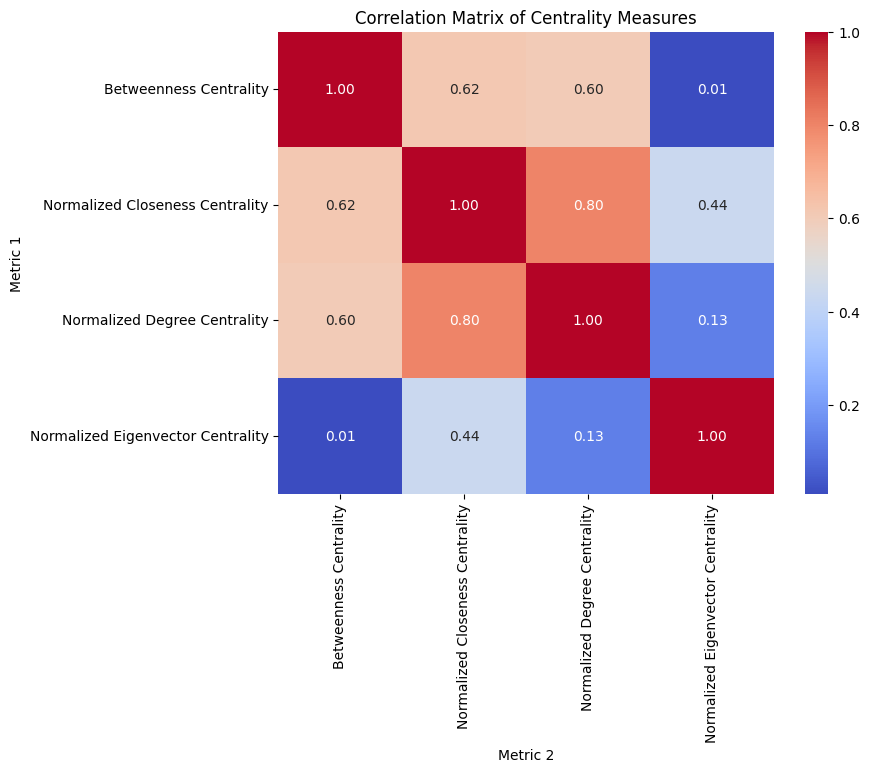

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Convert Spark DataFrame to Pandas DataFrame for visualization
correlation_pd_df = correlation_df.toPandas()

# Pivot the DataFrame to create a matrix form
correlation_matrix = correlation_pd_df.pivot("Metric 1", "Metric 2", "Correlation")

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Centrality Measures")
plt.show()

In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import rank, col

# Define a window spec partitioned by BU and ordered by Combined Centrality Score in descending order
windowSpec = Window.partitionBy("BU").orderBy(col("Combined Centrality Score").desc())

# Use the rank function over the defined window spec
ranked_df = final_df_with_combined_centrality.withColumn("rank", rank().over(windowSpec))

# Filter to get top 5 for each BU
top_5_df = ranked_df.filter(col("rank") <= 5)

# Drop all centrality measures from the DataFrame except Combined Centrality Score
top_5_df = top_5_df.drop("Betweenness Centrality", "Closeness Centrality", "Eigenvector Centrality", "Degree Centrality", "Normalized Degree Centrality", "Normalized Eigenvector Centrality", "Normalized Closeness Centrality")

display(top_5_df)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Convert node 2668 attributes to a Spark DataFrame with columns for each attribute
node_2668_attributes = [(key, value) for key, value in Gr.nodes[396].items()]
node_2668_df = spark.createDataFrame(node_2668_attributes, ['Attribute', 'Value'])

# Display the attributes of node 2668
display(node_2668_df)


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Create a subgraph for all nodes pointing to node 2668 and its neighbors
pointing_nodes_3890 = list(Gr.predecessors(1))
pointing_and_neighbors_nodes = pointing_nodes_3890 + list(Gr.neighbors(1)) + [1]
subgraph_pointing_and_neighbors = Gr.subgraph(pointing_and_neighbors_nodes)

# Generate positions for each node using NetworkX's layout algorithm
pos = nx.spring_layout(subgraph_pointing_and_neighbors)

# Prepare labels with 'Person ID' instead of node number
labels = {node: Gr.nodes[node].get('attr_dict').get('Person ID', node) for node in subgraph_pointing_and_neighbors.nodes()}

# Draw the subgraph with 'Person ID' as labels
plt.figure(figsize=(6, 4))
nx.draw(subgraph_pointing_and_neighbors, pos, labels=labels, with_labels=True, node_color='lightgreen', edge_color='gray')
plt.title('Subgraph showing all nodes pointing to 114332 and its neighbors')

# Save the plot as an image and display it in Databricks
plt.savefig("/tmp/subgraph_pointing_and_neighbors_2668.png")
display("/tmp/subgraph_pointing_and_neighbors_2668.png")

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Filter the final DataFrame to include only female employees
female_employees_df = final_df_with_degree_centrality.filter(final_df_with_degree_centrality['Gender'] == 'F')

# Display the filtered DataFrame
display(female_employees_df)


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
from pyspark.sql.functions import col

# Combine the centrality measures to create a single score (using Betweenness Centrality directly)
female_employees_df = female_employees_df.withColumn(
    "Combined Centrality",
    col("Normalized Degree Centrality") + 
    col("Normalized Closeness Centrality") + 
    col("Betweenness Centrality") +  # Use the original Betweenness Centrality
    col("Normalized Eigenvector Centrality")
)

# Sort the DataFrame by the combined centrality score in descending order
top_500_female_df = female_employees_df.orderBy(col("Combined Centrality").desc()).limit(500)

# Display the top 500 female employees
display(top_500_female_df)




---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import rank

# Define a window specification to rank female employees within each Business Unit by combined centrality score
window_spec = Window.partitionBy('BU').orderBy(col("Combined Centrality").desc())

# Add a rank column to rank female employees by combined centrality within each Business Unit
ranked_female_df = top_500_female_df.withColumn('rank', rank().over(window_spec))

# Filter to get only the top 5 female employees for each Business Unit
top_5_female_by_bu_df = ranked_female_df.filter(col('rank') <= 5)

# Drop the rank column if it's no longer needed
top_5_female_by_bu_df = top_5_female_by_bu_df.drop('rank')

# Display the top 5 female employees by combined centrality for each Business Unit
display(top_5_female_by_bu_df)


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
from pyspark.sql.functions import col, count, when

# Combine the centrality measures to create a single score (you can adjust the weights as needed)
all_employees_df = final_df_with_degree_centrality.withColumn(
    "Combined Centrality",
    col("Normalized Degree Centrality") + 
    col("Normalized Closeness Centrality") + 
    col("Betweenness Centrality") + 
    col("Normalized Eigenvector Centrality")
)

# Sort the DataFrame by the combined centrality score in descending order and get the top 500
top_500_all_employees_df = all_employees_df.orderBy(col("Combined Centrality").desc()).limit(500)

# Display the top 500 employees
display(top_500_all_employees_df)

# Calculate the number of female employees in the top 500
female_count = top_500_all_employees_df.filter(col("Gender") == "F").count()

# Calculate the proportion of female employees in the top 500
female_proportion = female_count / top_500_all_employees_df.count()

# Display the results
print(f"Number of female employees in top 500: {female_count}")
print(f"Proportion of female employees in top 500: {female_proportion:.2%}")


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
from pyspark.sql.functions import col, desc

# Combine the normalized centrality measures to create a single score (you can adjust the weights as needed)
final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
    "Combined Centrality",
    col("Normalized Degree Centrality") + 
    col("Normalized Closeness Centrality") + 
    col("Betweenness Centrality") + 
    col("Normalized Eigenvector Centrality")
)

# Sort the DataFrame by the combined centrality score in descending order and get the top 500 employees
top_500_df = final_df_with_degree_centrality.orderBy(col("Combined Centrality").desc()).limit(500)

# Filter to include only female employees in the top 500
top_500_female_df = top_500_df.filter(col("Gender") == "F")

# Display the DataFrame of the top 500 female employees
display(top_500_female_df)

# Now filter the top 100 employees
top_100_df = final_df_with_degree_centrality.orderBy(col("Combined Centrality").desc()).limit(100)

# Count the number of female employees in the top 100
top_100_female_df = top_100_df.filter(col("Gender") == "F")
female_count_top_100 = top_100_female_df.count()

# Calculate the proportion of female employees in the top 100
female_proportion_top_100 = female_count_top_100 / top_100_df.count()

# Display the DataFrame of the top 100 female employees
display(top_100_female_df)

# Print the count and proportion of female employees in the top 100
print(f"Number of female employees in the top 100: {female_count_top_100}")
print(f"Proportion of female employees in the top 100: {female_proportion_top_100:.2%}")


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
from pyspark.sql.functions import col

female_count = final_df_with_degree_centrality.filter(col("Gender") == "F").count()

total_count = final_df_with_degree_centrality.count()

female_proportion = female_count / total_count

print(f"Number of female employees: {female_count}")
print(f"Proportion of female employees: {female_proportion:.2%}")


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

### Combining Centralities and ranking

In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import dense_rank, col

# Define window specification for Degree Centrality ranking
windowSpec_degree = Window.orderBy(col("Normalized Degree Centrality").desc())

# Rank Person IDs based on Degree Centrality using dense_rank
ranked_df = final_df_with_degree_centrality.withColumn("Rank by Degree Centrality", dense_rank().over(windowSpec_degree))

# Define a separate window specification for Closeness Centrality
windowSpec_closeness = Window.orderBy(col("Normalized Closeness Centrality").desc())
ranked_df = ranked_df.withColumn("Rank by Closeness Centrality", dense_rank().over(windowSpec_closeness))

# Define a separate window specification for Betweenness Centrality
windowSpec_betweenness = Window.orderBy(col("Betweenness Centrality").desc())
ranked_df = ranked_df.withColumn("Rank by Betweenness Centrality", dense_rank().over(windowSpec_betweenness))

# Define a separate window specification for Eigenvector Centrality
windowSpec_eigenvector = Window.orderBy(col("Normalized Eigenvector Centrality").desc())
ranked_df = ranked_df.withColumn("Rank by Eigenvector Centrality", dense_rank().over(windowSpec_eigenvector))

# Display the DataFrame with dense ranks
display(ranked_df)


/databricks/spark/python/pyspark/sql/connect/expressions.py:968: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality,Normalized Degree Centrality,Normalized Eigenvector Centrality,Normalized Closeness Centrality,Rank by Degree Centrality,Rank by Closeness Centrality,Rank by Betweenness Centrality,Rank by Eigenvector Centrality
114332,Rail,M,PDEL-RAIL-OPML,"Operations Manager NSW, QLD & New Zealand",Rail New Zealand,0.0,0.022113140990345052,0.712402870847445,0.003168854685377999,0.35000000000000003,1.0,0.9601786384504323,14,2,87,1
59536,Infrastructure,M,PDEL-INFR-GEMO,General Manager Infrastructure NSW/ACT/QLD,Infrastructure NSW/ACT,0.0,0.019234541628523533,0.6040912326694563,0.0036215482118605704,0.4,0.8479629397766254,0.8351864622107537,12,3,87,2
54703,Major Projects,M,PDEL-INFR-PRD1B,Project Director,M7-M12 Project,0.0,0.012410103461395714,0.29189743534925067,0.0015844273426889996,0.17500000000000002,0.4097364669525624,0.538861315531548,21,14,87,3
22510,Rail,M,PDEL-RAIL-PRD,Alliance General Manager,North Western Program Alliance - R,0.0,0.013959369401907834,0.17122924220759947,0.0011317338162064282,0.125,0.2403545089622775,0.6061322682201803,23,7,87,4
62061,Building,M,PDEL-BUILD-GEMB,General Manager Building NSW/ACT,Building NSW/ACT Operations,0.0,0.01004205971247062,0.0776221090810132,9.053870529651426E-4,0.1,0.10895816434123895,0.4360380656084951,24,22,87,5
90346,Building,M,PDEL-BUILD-GEMB,General Manager Building QLD/NT,Building QLD/NT Operations,0.0,0.011838416248170355,0.0670372393242477,0.002489814395654142,0.275,0.09410018132355638,0.5140379830952417,17,17,87,6
92139,Infrastructure,M,PDEL-INFR-PRD,Project Director,Upper South Creek Advanced Water Recycling Centre,6.277463263825654E-6,0.008355595222249775,0.030822287642331688,0.0018107741059302852,0.2,0.043265249062611144,0.3628097902258949,20,28,12,7
110476,Rail,M,PDEL-RAIL-PRD,Project Director,Gold Coast Light Rail Stage 3,1.0207257339553908E-5,0.0125144933476082,0.030481432753219243,0.002489814395654142,0.275,0.04278679101160964,0.5433940473969697,17,13,2,8
94457,Infrastructure,M,PDEL-INFR-GEMO,General Manager Infrastructure VIC/SA/TAS,Infrastructure VIC/SA/TAS,0.0,0.015745354487851578,0.015031099932277447,0.004979628791308284,0.55,0.021099156874744725,0.6836818451374974,7,5,87,9
88714,Major Projects,M,PDEL-INFR-CD1B,Construction Director,M7-M12 Project,4.49119322940372E-6,0.005716555125928091,0.013952121575125001,0.0015844273426889996,0.17500000000000002,0.01958459481820442,0.2482195595748709,21,36,20,10


In [0]:
from pyspark.sql import functions as F

# List of columns to calculate correlation between
columns = [
    "Rank by Degree Centrality",
    "Rank by Betweenness Centrality",
    "Rank by Closeness Centrality",
    "Rank by Eigenvector Centrality"
]

# Calculate correlation for each pair of columns and print the results
for i in range(len(columns)):
    for j in range(i + 1, len(columns)):
        col1 = columns[i]
        col2 = columns[j]
        correlation = ranked_df.stat.corr(col1, col2)
        print(f"Correlation between {col1} and {col2}: {correlation}")

/databricks/spark/python/pyspark/sql/connect/expressions.py:968: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


Correlation between Rank by Degree Centrality and Rank by Betweenness Centrality: 0.7044348589137083
Correlation between Rank by Degree Centrality and Rank by Closeness Centrality: 0.8770990334114622
Correlation between Rank by Degree Centrality and Rank by Eigenvector Centrality: 0.6673803166926738
Correlation between Rank by Betweenness Centrality and Rank by Closeness Centrality: 0.7603780506401678
Correlation between Rank by Betweenness Centrality and Rank by Eigenvector Centrality: 0.6891205847385508
Correlation between Rank by Closeness Centrality and Rank by Eigenvector Centrality: 0.8823476157282761


In [0]:
# Drop the "Combined Centrality" column from the DataFrame
ranked_df = ranked_df.drop("Combined Centrality")

# Display the updated DataFrame
display(ranked_df)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Convert ranked_df to Pandas DataFrame and save as CSV file
ranked_df.toPandas().to_csv("/Workspace/Shared/ranked_df.csv", index=False)

/databricks/spark/python/pyspark/sql/connect/expressions.py:968: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


In [0]:
from pyspark.sql.functions import col, collect_list

# Create a DataFrame with Person IDs listed based on their respective centrality measure
df_person_ids_by_centrality = ranked_df.select(
    collect_list(col("Person ID")).alias("Person IDs by Degree Centrality"),
    collect_list(col("Person ID")).alias("Person IDs by Closeness Centrality"),
    collect_list(col("Person ID")).alias("Person IDs by Betweenness Centrality"),
    collect_list(col("Person ID")).alias("Person IDs by Eigenvector Centrality")
)

# Display the new DataFrame
display(df_person_ids_by_centrality)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
from pyspark.sql.functions import col

# Sort the DataFrame by "Degree Centrality" in descending order
sorted_df = ranked_df.orderBy(col("Normalized Degree Centrality").desc())

# Select the "Person ID" and "Degree Centrality" columns and rename them
degree_centrality_df = sorted_df.select(
    col("Person ID").alias("Person ID by Degree of Centrality"),
    col("Degree Centrality").alias("Degree Measure")
)

# Display the result
display(degree_centrality_df)


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Sort the DataFrame by "Degree Centrality" in descending order
sorted_bdf = ranked_df.orderBy(col("Betweenness Centrality").desc())

# Select the "Person ID" and "Degree Centrality" columns and rename them
betweeness_centrality_df = sorted_df.select(
    col("Person ID").alias("Person ID by Betweeness Centrality"),
    col("Betweenness Centrality").alias("Degree Measure")
)

display(betweeness_centrality_df)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Sort the DataFrame by "Degree Centrality" in descending order
sorted_edf = ranked_df.orderBy(col("Normalized Eigenvector Centrality").desc())

# Select the "Person ID" and "Degree Centrality" columns and rename them
eigen_centrality_df = sorted_df.select(
    col("Person ID").alias("Person ID by Eigenvector Centrality"),
    col("Normalized Eigenvector Centrality").alias("Degree Measure")
)

display(eigen_centrality_df)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Sort the DataFrame by "Degree Centrality" in descending order
sorted_cdf = final_df_with_degree_centrality.orderBy(col("Normalized Closeness Centrality").desc())

# Select the "Person ID" and "Degree Centrality" columns and rename them
closeness_centrality_df = sorted_df.select(
    col("Person ID").alias("Person ID by Closeness Centrality"),
    col("Normalized Closeness Centrality").alias("Degree Measure")
)

display(closeness_centrality_df)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Sort the DataFrame by "Degree Centrality" in descending order
sorted_bdf = final_df_with_degree_centrality.orderBy(col("Betweenness Centrality").desc())

# Select the "Person ID" and "Degree Centrality" columns and rename them
betweeness_centrality_df = sorted_df.select(
    col("Person ID").alias("Person ID by Betweeness Centrality"),
    col("Betweenness Centrality").alias("Degree Measure")
)
# Sort the DataFrame by "Degree Centrality" in descending order
sorted_edf = final_df_with_degree_centrality.orderBy(col("Normalized Eigenvector Centrality").desc())

# Select the "Person ID" and "Degree Centrality" columns and rename them
eigen_centrality_df = sorted_df.select(
    col("Person ID").alias("Person ID by Eigenvector Centrality"),
    col("Normalized Eigenvector Centrality").alias("Degree Measure")
)

# Sort the DataFrame by "Degree Centrality" in descending order
sorted_cdf = final_df_with_degree_centrality.orderBy(col("Normalized Closeness Centrality").desc())

# Select the "Person ID" and "Degree Centrality" columns and rename them
closeness_centrality_df = sorted_df.select(
    col("Person ID").alias("Person ID by Closeness Centrality"),
    col("Normalized Closeness Centrality").alias("Degree Measure")
)

# combine all
combine_df = degree_centrality_df.union(betweeness_centrality_df).union(eigen_centrality_df).union(closeness_centrality_df)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
ranked_df.columns

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# Step 1: Filter the DataFrame for BU = 'Rail'
filtered_df = ranked_df.filter(ranked_df['BU'] == 'Rail')

# Step 2: Select the necessary columns
BU_centrality = filtered_df.select(
    'Person ID',
    'BU',
    'Gender',
    'JH Position Title (externalCode)',
    'External Title',
    'Betweenness Centrality',
    'Rank by Betweenness Centrality'
)

# Step 3: Define a window to rank within the 'Rail' BU
window_spec = Window.orderBy('Rank by Betweenness Centrality')

# Step 4: Add the 'BU Ranking' using row_number() window function
BU_centrality = BU_centrality.withColumn(
    'BU Ranking',
    F.row_number().over(window_spec)
)

# Step 5: Show the result
display(BU_centrality)


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Step 1: Filter the DataFrame to include only the top 50 ranks
top_50 = BU_centrality.filter(BU_centrality['BU Ranking'] <= 100)

# Step 2: Group by 'Gender' and count the number of males and females in the top 50 ranks
gender_split_BC = top_50.groupBy('Gender').count()

# Step 3: Show the male-to-female split
display(gender_split_BC)


---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [0]:
# Step 2: Further filter the DataFrame for Gender = 'F'
female_details = top_50.filter(top_50['Gender'] == 'F')

# Step 3: Show the details for female employees in the top 50
display(female_details)

---------------------------------------------------------------------------
TypeError                                 Traceback (most recent call last)
File <command-1397295937138353>, line 16
     12 eigenvector_min = final_df_with_degree_centrality.select(min("Eigenvector Centrality")).first()[0]
     13 eigenvector_max = final_df_with_degree_centrality.select(max("Eigenvector Centrality")).first()[0]
     14 final_df_with_degree_centrality = final_df_with_degree_centrality.withColumn(
     15     "Normalized Eigenvector Centrality", 
---> 16     (final_df_with_degree_centrality["Eigenvector Centrality"] - eigenvector_min) / (eigenvector_max - eigenvector_min)
     17 )
     19 # Normalize closeness centrality
     20 closeness_min = final_df_with_degree_centrality.select(min("Closeness Centrality")).first()[0]

TypeError: unsupported operand type(s) for -: 'str' and 'str'